### Fine tuning
The script's approach to fine-tuning the model revolves around an iterative process of optimizing hyperparameters and training strategies to enhance the performance of the reinforcement learning agent in the context of the Iowa Gambling Task (IGT).

In [4]:
# Import libaries
import tensorflow as tf
import numpy as np
import pandas as pd
import json
import time

# Load the dataset
df = pd.read_excel('EmotionsIGTData.xlsx', engine='openpyxl')

/usr/local/lib/python3.10/site-packages/openpyxl/worksheet/_reader.py:329: UserWarning: Unknown extension is not supported and will be removed
  warn(msg)


### Modifying the model
- Environment Simplification: The CustomIGTEnvironment class in this script simplifies the IGT environment compared to the previous script. It does not incorporate noise or additional parameters, such as noise_factor, which were included in the previous environment. This simplified environment focuses primarily on the core IGT task and serves as a different testing ground for fine-tuning.

- Reward Calculation: The script defines a reward calculation function, calculate_reward, which computes rewards based on the agent's actions. Unlike the previous script, which included complex reward rules specific to the IGT, this script adopts a simplified reward structure. It assigns rewards to each deck (four in total) with a predefined reward table, with the agent's reward calculated as the difference between the selected deck's reward and the maximum possible reward. This simplification is designed for experimental purposes to test and fine-tune reinforcement learning agents.

- Focused Testing Environment: The CustomIGTEnvironment in this script primarily serves as a focused testing environment for agents undergoing fine-tuning. It offers a different testing scenario by reducing the complexity introduced by noise and additional parameters. This targeted environment allows for the exploration of specific fine-tuning strategies and hyperparameter adjustments.

- Fine-Tuning Evaluation: The script is designed to assess and refine the reinforcement learning agent's performance under this simplified IGT environment. It aims to evaluate the agent's adaptability and decision-making capabilities while learning from straightforward reward structures. Fine-tuning in this context serves the purpose of optimizing the agent's performance within this controlled and simplified IGT setting.

- Diversity in Hyperparameters: Fine-tuning efforts may include adjusting parameters like learning rates, discount factors, or exploration strategies specific to this simplified IGT environment. This script provides a platform to experiment with these hyperparameters and gauge their impact on agent performance in a less intricate environment.

- Comparative Analysis: The key distinction lies in the purpose of fine-tuning. While the previous script focused on optimizing agent performance in a comprehensive and noise-inclusive IGT scenario, this script narrows its scope to the core IGT task. The comparative analysis of fine-tuning results between the two scripts can help determine the effectiveness of strategies in different IGT contexts.

It simplifies the environment and focuses on straightforward reward calculations, allowing for the fine-tuning of agents in a controlled and less complex setting. The primary aim is to evaluate and optimize agent performance in this specific IGT context, which differs from the broader and more intricate IGT environment presented in the previous script.

In [5]:
# Define the CustomIGTEnvironment class
class CustomIGTEnvironment:
    def __init__(self, data):
        self.data = data
        self.num_trials = len(data)
        self.current_trial = 0

    def reset(self):
        self.current_trial = 0
        initial_state = np.array([0, 0, 0, 0])  # Initial state, assuming all decks are unchosen
        return initial_state

    def step(self, action):
        if self.current_trial >= self.num_trials:
            raise ValueError("Episode is already done. Call reset() to start a new episode.")

        current_trial_data = self.data.iloc[self.current_trial]
        self.current_trial += 1
        state_space = np.array([current_trial_data['IGT_NET_Raw'], current_trial_data['IGT_NET_1Raw'],
                                current_trial_data['IGT_NET_2Raw'], current_trial_data['IGT_NET_3Raw']])

        reward = calculate_reward(state_space, action)  # Implement calculate_reward function
        done = (self.current_trial >= self.num_trials)

        return state_space, reward, done

# Define the calculate_reward function
def calculate_reward(state, action):
    # Define the reward table for each deck (replace with your actual values)
    deck_rewards = [100, 50, 20, 10]  # Example rewards for each deck (adjust as needed)
    
    # Get the reward for the selected deck based on the action
    selected_deck_reward = deck_rewards[action]
    
    # Get the maximum reward among all decks
    max_deck_reward = max(deck_rewards)
    
    # Calculate the reward as the difference between selected deck reward and max reward
    reward = selected_deck_reward - max_deck_reward
    
    return reward

### Creating Adam optimizer
The primary purpose of the following code is to create a specialized Adam optimizer with custom attributes and behavior. It defines the CustomAdamOptimizer class, which extends the base Adam optimizer provided by TensorFlow/Keras. This customization allows for fine-grained control over the optimizer's behavior during training.

The CustomAdamOptimizer introduces a custom learning rate, which can be set during initialization. This feature enables practitioners to adjust the learning rate specifically for their use case. Unlike the previous scripts, which focused on the entire reinforcement learning pipeline, this script hones in on enhancing optimization during training.

This script also overrides methods for slot creation and management. It explicitly defines the creation and management of slots for m (momentum) and v (velocity) variables associated with the Adam optimizer. This level of control allows users to fine-tune optimizer internals to suit their needs.

By creating a custom optimizer, users can configure hyperparameters such as the learning rate, beta1 (momentum), beta2 (velocity), and epsilon. This flexibility is valuable when optimizing neural networks and other machine learning models, but it is a specialized concern separate from the high-level design of reinforcement learning environments and agents.

Additionally, the script includes a custom _resource_apply_dense method, which handles the update logic for the optimizer. It computes updated variable values based on gradients, learning rates, and other hyperparameters. This fine-grained control over the update process is specific to the optimization phase of training and distinct from the agent's policy or the environment's dynamics.

Customizing the optimizer's behavior and hyperparameters can significantly impact the training process, but it is generally handled at a lower level of the machine learning stack. This script addresses optimizer customization in isolation, while previous scripts encompassed the broader context of reinforcement learning, including agents, environments, and training loops.


In [6]:
# Define the CustomAdamOptimizer class
class CustomAdamOptimizer(tf.keras.optimizers.Adam):
    def __init__(self, learning_rate=0.001, **kwargs):
        name = kwargs.pop('name', 'CustomAdamOptimizer')
        super(CustomAdamOptimizer, self).__init__(name=name, **kwargs)
        self.learning_rate = learning_rate

    def get_config(self):
        config = super(CustomAdamOptimizer, self).get_config()
        config.update({
            'learning_rate': self.learning_rate,
        })
        return config

    def _create_slots(self, var_list):
        for var in var_list:
            self.add_slot(var, 'm')
            self.add_slot(var, 'v')

    def _resource_apply_dense(self, grad, var, **kwargs):
        var_dtype = var.dtype.base_dtype
        lr_t = tf.cast(self.learning_rate, var_dtype)
        beta1_t = tf.constant(0.9, dtype=var_dtype)
        beta2_t = tf.constant(0.999, dtype=var_dtype)
        epsilon_t = tf.constant(1e-7, dtype=var_dtype)

        m = self.get_slot(var, 'm')
        v = self.get_slot(var, 'v')

        m_t = m.assign(beta1_t * m + (1.0 - beta1_t) * grad)
        v_t = v.assign(beta2_t * v + (1.0 - beta2_t) * grad * grad)

        var_update = var.assign_sub(lr_t * m_t / (tf.sqrt(v_t) + epsilon_t))

        return var_update


It stands apart from the previous scripts, which focused on the holistic design and fine-tuning of reinforcement learning agents within specific environments. The optimization concerns addressed by this script primarily cater to practitioners seeking to fine-tune the optimizer's behavior for training various machine learning models.

### Fine tuning
The following script is designed for fine-tuning pre-trained models using different hyperparameters and early stopping criteria. It differs from the previous scripts as it focuses on optimizing pre-existing models with various combinations of hyperparameters and early stopping techniques, rather than constructing reinforcement learning agents and environments from scratch.

The primary objective of this script is to fine-tune previously trained models. It loads pre-trained models, adjusts hyperparameters (learning rate, epsilon, and discount factor), and continues training these models on a given environment. This allows for further optimization of agent behavior with a specific emphasis on improving learning performance.

The script introduces a custom load_model_with_custom_optimizer function that can load pre-trained models with custom optimizers. This feature facilitates the extension of model training with different optimizers, which is crucial for improving learning speed and performance.

To ensure fine-tuning starts from a clean slate, the script clones loaded models and transfers their weights. This guarantees that fine-tuning doesn't compromise the integrity of the original pre-trained models.Fine-tuning includes variations in learning rates, epsilon values, and discount factors to explore how different hyperparameter settings impact learning performance. These hyperparameters are the main focus of fine-tuning, allowing practitioners to experiment with different configurations and assess their effects.

Moreover, the script incorporates early stopping criteria, monitoring the average reward achieved during fine-tuning. Training is halted if the average reward reaches a certain threshold or if it fails to improve after a specified number of episodes (early stopping patience).

Fine-tuning is also subject to a time limit. If the fine-tuning process exceeds the defined time limit (in minutes), the script automatically stops. This restriction ensures that fine-tuning doesn't run indefinitely, especially when experimenting with various hyperparameter combinations.

After each fine-tuning run, the script saves important information, including hyperparameters, average rewards, training history, elapsed time, and more, in an output file. This allows for a comprehensive analysis of the results and assists in selecting the best-performing models and hyperparameters.

This step engages in an iterative optimization process, examining multiple hyperparameter combinations and pre-trained models. For each combination, it initiates a fine-tuning session and saves the results, providing a range of models with varying performance levels.

While the earlier scripts constructed reinforcement learning agents and environments, this script assumes the presence of pre-trained models and focuses on enhancing their performance. It complements the earlier scripts by serving as a post-training optimization phase for reinforcement learning models.

In [7]:
# Define the function to load models with custom optimizer
def load_model_with_custom_optimizer(model_path):
    custom_objects = {'CustomAdamOptimizer': CustomAdamOptimizer}
    return tf.keras.models.load_model(model_path, custom_objects=custom_objects)

# List of pre-trained model paths (replace with your model file paths)
pretrained_model_paths = [
    'model_0.1_0.1.keras',
    'model_0.1_0.2.keras',
    'model_0.1_0.3.keras',
    'model_0.01_0.1.keras',
    'model_0.01_0.2.keras',
    'model_0.01_0.3.keras',
    'model_0.001_0.1.keras',
    'model_0.001_0.2.keras',
    'model_0.001_0.3.keras'
]

def fine_tune_model(lr, epsilon, discount_factor, num_episodes, batch_size, model_path, env,
                    early_stop_threshold=0.9, early_stop_patience=10,
                    time_limit_minutes=30, output_file='fine_tuning_output.json'):
    start_time = time.time()

    # Load the model for fine-tuning
    loaded_model = load_model_with_custom_optimizer(model_path)

    # Clone the loaded model to start with a fresh copy for fine-tuning
    fine_tuned_model = tf.keras.models.clone_model(loaded_model)
    fine_tuned_model.set_weights(loaded_model.get_weights())  # Copy weights

    discount_factor_fine_tune = discount_factor

    episode_rewards = []
    training_history = []

    # Early stopping variables
    best_average_reward = -float('inf')
    early_stopping_count = 0

    # Compile the fine-tuned model
    fine_tuned_model.compile(optimizer=tf.keras.optimizers.Adam(lr=lr), loss='mean_squared_error')

    # Fine-tune the loaded model
    for episode in range(num_episodes):
        state = env.reset()
        episode_reward = 0

        # Create buffers to store batch data
        state_buffer = []
        target_buffer = []

        while True:
            action = np.argmax(fine_tuned_model.predict(state[np.newaxis, :]))
            next_state, reward, done = env.step(action)

            episode_reward += reward

            # Store data for experience replay
            state_buffer.append(state)
            target = reward if done else reward + discount_factor * np.max(fine_tuned_model.predict(next_state[np.newaxis, :]))
            target_buffer.append(target)

            if len(state_buffer) >= batch_size or done:
                # Train the model using the collected batch
                fine_tuned_model.fit(np.array(state_buffer), np.array(target_buffer), epochs=1, verbose=0)

                # Clear the buffers
                state_buffer.clear()
                target_buffer.clear()

            if done:
                break

            state = next_state

        episode_rewards.append(episode_reward)

        # Log training history for this episode
        recent_rewards = episode_rewards[-early_stop_patience:]
        recent_average_reward = np.mean(recent_rewards)
        training_history.append({
            'episode': episode,
            'average_reward': recent_average_reward
        })

        # Early stopping check
        if recent_average_reward >= early_stop_threshold:
            break

        # Check elapsed time and stop if it exceeds the time limit
        elapsed_time_minutes = (time.time() - start_time) / 60.0
        if elapsed_time_minutes > time_limit_minutes:
            print(f"Time limit exceeded ({time_limit_minutes} minutes). Stopping fine-tuning.")
            break

    # Save the fine-tuned model with a unique name based on hyperparameters
    model_save_path = f"fine_tuned_model_lr_{lr}_epsilon_{epsilon}_discount_{discount_factor}.keras"
    fine_tuned_model.save(model_save_path)

    # Save useful output to the output file
    output_data = {
        'lr': lr,
        'epsilon': epsilon,
        'discount_factor': discount_factor_fine_tune,
        'average_reward': recent_average_reward,  # Use recent_average_reward
        'training_history': training_history,
        'elapsed_time_minutes': elapsed_time_minutes
    }

    with open(output_file, 'w') as f:
        json.dump(output_data, f, indent=4)

    return output_data

if __name__ == '__main__':
    # Define hyperparameters for fine-tuning
    learning_rates = [0.001, 0.01, 0.1]
    epsilons = [0.1, 0.2, 0.3]
    discount_factors = [0.9, 0.95, 0.99]
    num_episodes = 10  # Reduced number of episodes for faster fine-tuning
    batch_size = 100  # Increased batch size for faster training
    early_stop_threshold = 0.9
    time_limit_minutes = 30  # Set the time limit for fine-tuning
    output_file = 'fine_tuning_output.json'  # Output file name

    early_stop_patience = 10  # Define early_stop_patience here

    # Use a specific environment instance (You need to create the 'env' instance based on your CustomIGTEnvironment class)
    env = CustomIGTEnvironment(df)

    # Iterate over the combinations of hyperparameters and model paths
    for lr in learning_rates:
        for epsilon in epsilons:
            for discount_factor in discount_factors:
                for model_path in pretrained_model_paths:
                    fine_tune_model(lr, epsilon, discount_factor, num_episodes, batch_size, model_path, env,
                                    early_stop_threshold, early_stop_patience, time_limit_minutes, output_file)

    print("Fine-tuning is done.")

2023-10-09 02:46:43.333933: I tensorflow/core/common_runtime/process_util.cc:146] Creating new thread pool with default inter op setting: 2. Tune using inter_op_parallelism_threads for best performance.


1/1 [==============================] - 0s 22ms/step


1/1 [==============================] - 0s 21ms/step


1/1 [==============================] - 0s 22ms/step


1/1 [==============================] - 0s 23ms/step


1/1 [==============================] - 0s 22ms/step


1/1 [==============================] - 0s 22ms/step


1/1 [==============================] - 0s 23ms/step


1/1 [==============================] - 0s 21ms/step


1/1 [==============================] - 0s 22ms/step


1/1 [==============================] - 0s 21ms/step


1/1 [==============================] - 0s 21ms/step


1/1 [==============================] - 0s 22ms/step


1/1 [==============================] - 0s 27ms/step


1/1 [==============================] - 0s 21ms/step


1/1 [==============================] - 0s 25ms/step


1/1 [==============================] - 0s 21ms/step


1/1 [==============================] - 0s 22ms/step


1/1 [==============================] - 0s 20ms/step


1/1 [==============================] - 0s 21ms/step


1/1 [==============================] - 0s 22ms/step


1/1 [==============================] - 0s 22ms/step


1/1 [==============================] - 0s 21ms/step


1/1 [==============================] - 0s 22ms/step


1/1 [==============================] - 0s 22ms/step


1/1 [==============================] - 0s 21ms/step


1/1 [==============================] - 0s 22ms/step


1/1 [==============================] - 0s 21ms/step


1/1 [==============================] - 0s 23ms/step


1/1 [==============================] - 0s 21ms/step


1/1 [==============================] - 0s 21ms/step


1/1 [==============================] - 0s 21ms/step


1/1 [==============================] - 0s 22ms/step


1/1 [==============================] - 0s 21ms/step


1/1 [==============================] - 0s 21ms/step


1/1 [==============================] - 0s 21ms/step


1/1 [==============================] - 0s 22ms/step


1/1 [==============================] - 0s 23ms/step


1/1 [==============================] - 0s 21ms/step


1/1 [==============================] - 0s 21ms/step


1/1 [==============================] - 0s 21ms/step


1/1 [==============================] - 0s 22ms/step


1/1 [==============================] - 0s 23ms/step


1/1 [==============================] - 0s 22ms/step


1/1 [==============================] - 0s 22ms/step


1/1 [==============================] - 0s 22ms/step


1/1 [==============================] - 0s 22ms/step


1/1 [==============================] - 0s 21ms/step


1/1 [==============================] - 0s 25ms/step


1/1 [==============================] - 0s 26ms/step


1/1 [==============================] - 0s 26ms/step


1/1 [==============================] - 0s 21ms/step


1/1 [==============================] - 0s 24ms/step


1/1 [==============================] - 0s 21ms/step


1/1 [==============================] - 0s 23ms/step


1/1 [==============================] - 0s 25ms/step


1/1 [==============================] - 0s 23ms/step


1/1 [==============================] - 0s 22ms/step


1/1 [==============================] - 0s 22ms/step


1/1 [==============================] - 0s 22ms/step


1/1 [==============================] - 0s 22ms/step


1/1 [==============================] - 0s 21ms/step


1/1 [==============================] - 0s 23ms/step


1/1 [==============================] - 0s 21ms/step


1/1 [==============================] - 0s 21ms/step


1/1 [==============================] - 0s 21ms/step


1/1 [==============================] - 0s 21ms/step


1/1 [==============================] - 0s 22ms/step


1/1 [==============================] - 0s 22ms/step


1/1 [==============================] - 0s 21ms/step


1/1 [==============================] - 0s 21ms/step


1/1 [==============================] - 0s 22ms/step


1/1 [==============================] - 0s 22ms/step


1/1 [==============================] - 0s 22ms/step


1/1 [==============================] - 0s 22ms/step


1/1 [==============================] - 0s 22ms/step


1/1 [==============================] - 0s 22ms/step


1/1 [==============================] - 0s 21ms/step


1/1 [==============================] - 0s 22ms/step


1/1 [==============================] - 0s 23ms/step


1/1 [==============================] - 0s 22ms/step


1/1 [==============================] - 0s 22ms/step


1/1 [==============================] - 0s 21ms/step


1/1 [==============================] - 0s 21ms/step


1/1 [==============================] - 0s 21ms/step


1/1 [==============================] - 0s 23ms/step


1/1 [==============================] - 0s 23ms/step


1/1 [==============================] - 0s 22ms/step


1/1 [==============================] - 0s 26ms/step


1/1 [==============================] - 0s 27ms/step


1/1 [==============================] - 0s 26ms/step


1/1 [==============================] - 0s 26ms/step


1/1 [==============================] - 0s 24ms/step


1/1 [==============================] - 0s 28ms/step


1/1 [==============================] - 0s 26ms/step


1/1 [==============================] - 0s 26ms/step


1/1 [==============================] - 0s 24ms/step


1/1 [==============================] - 0s 27ms/step


1/1 [==============================] - 0s 22ms/step


1/1 [==============================] - 0s 26ms/step


1/1 [==============================] - 0s 27ms/step


1/1 [==============================] - 0s 25ms/step


1/1 [==============================] - 0s 27ms/step


1/1 [==============================] - 0s 26ms/step


1/1 [==============================] - 0s 23ms/step


1/1 [==============================] - 0s 22ms/step


1/1 [==============================] - 0s 27ms/step


1/1 [==============================] - 0s 21ms/step


1/1 [==============================] - 0s 21ms/step


1/1 [==============================] - 0s 25ms/step


1/1 [==============================] - 0s 25ms/step


1/1 [==============================] - 0s 22ms/step


1/1 [==============================] - 0s 23ms/step


1/1 [==============================] - 0s 26ms/step


1/1 [==============================] - 0s 21ms/step


1/1 [==============================] - 0s 21ms/step


1/1 [==============================] - 0s 22ms/step


1/1 [==============================] - 0s 22ms/step


1/1 [==============================] - 0s 21ms/step


1/1 [==============================] - 0s 21ms/step


1/1 [==============================] - 0s 21ms/step


1/1 [==============================] - 0s 22ms/step


1/1 [==============================] - 0s 22ms/step


1/1 [==============================] - 0s 21ms/step


1/1 [==============================] - 0s 22ms/step


1/1 [==============================] - 0s 22ms/step


1/1 [==============================] - 0s 21ms/step


1/1 [==============================] - 0s 22ms/step


1/1 [==============================] - 0s 22ms/step


1/1 [==============================] - 0s 21ms/step


1/1 [==============================] - 0s 22ms/step


1/1 [==============================] - 0s 22ms/step


1/1 [==============================] - 0s 21ms/step


1/1 [==============================] - 0s 22ms/step


1/1 [==============================] - 0s 22ms/step


1/1 [==============================] - 0s 22ms/step


1/1 [==============================] - 0s 23ms/step


1/1 [==============================] - 0s 21ms/step


1/1 [==============================] - 0s 22ms/step


1/1 [==============================] - 0s 23ms/step


1/1 [==============================] - 0s 20ms/step


1/1 [==============================] - 0s 22ms/step


1/1 [==============================] - 0s 22ms/step


1/1 [==============================] - 0s 21ms/step


1/1 [==============================] - 0s 22ms/step


1/1 [==============================] - 0s 21ms/step


1/1 [==============================] - 0s 22ms/step


1/1 [==============================] - 0s 22ms/step


1/1 [==============================] - 0s 24ms/step


1/1 [==============================] - 0s 21ms/step


1/1 [==============================] - 0s 21ms/step


1/1 [==============================] - 0s 22ms/step


1/1 [==============================] - 0s 22ms/step


1/1 [==============================] - 0s 21ms/step


1/1 [==============================] - 0s 21ms/step


1/1 [==============================] - 0s 22ms/step


1/1 [==============================] - 0s 21ms/step


1/1 [==============================] - 0s 21ms/step


1/1 [==============================] - 0s 22ms/step


1/1 [==============================] - 0s 22ms/step


1/1 [==============================] - 0s 21ms/step


1/1 [==============================] - 0s 24ms/step


1/1 [==============================] - 0s 21ms/step


1/1 [==============================] - 0s 22ms/step


1/1 [==============================] - 0s 23ms/step


1/1 [==============================] - 0s 22ms/step


1/1 [==============================] - 0s 21ms/step


1/1 [==============================] - 0s 22ms/step


1/1 [==============================] - 0s 22ms/step


1/1 [==============================] - 0s 22ms/step


1/1 [==============================] - 0s 21ms/step


1/1 [==============================] - 0s 22ms/step


1/1 [==============================] - 0s 20ms/step


1/1 [==============================] - 0s 21ms/step


1/1 [==============================] - 0s 23ms/step


1/1 [==============================] - 0s 21ms/step


1/1 [==============================] - 0s 21ms/step


1/1 [==============================] - 0s 22ms/step


1/1 [==============================] - 0s 21ms/step


1/1 [==============================] - 0s 22ms/step


1/1 [==============================] - 0s 21ms/step


1/1 [==============================] - 0s 22ms/step


1/1 [==============================] - 0s 21ms/step


1/1 [==============================] - 0s 22ms/step


1/1 [==============================] - 0s 21ms/step


1/1 [==============================] - 0s 22ms/step


1/1 [==============================] - 0s 22ms/step


1/1 [==============================] - 0s 22ms/step


1/1 [==============================] - 0s 23ms/step


1/1 [==============================] - 0s 21ms/step


1/1 [==============================] - 0s 23ms/step


1/1 [==============================] - 0s 21ms/step


1/1 [==============================] - 0s 21ms/step


1/1 [==============================] - 0s 22ms/step


1/1 [==============================] - 0s 22ms/step


1/1 [==============================] - 0s 21ms/step


1/1 [==============================] - 0s 21ms/step


1/1 [==============================] - 0s 22ms/step


1/1 [==============================] - 0s 21ms/step


1/1 [==============================] - 0s 22ms/step


1/1 [==============================] - 0s 22ms/step


1/1 [==============================] - 0s 22ms/step


1/1 [==============================] - 0s 21ms/step


1/1 [==============================] - 0s 22ms/step


1/1 [==============================] - 0s 21ms/step


1/1 [==============================] - 0s 21ms/step


1/1 [==============================] - 0s 22ms/step


1/1 [==============================] - 0s 21ms/step


1/1 [==============================] - 0s 21ms/step


1/1 [==============================] - 0s 23ms/step


1/1 [==============================] - 0s 22ms/step


1/1 [==============================] - 0s 22ms/step


1/1 [==============================] - 0s 22ms/step


1/1 [==============================] - 0s 22ms/step


1/1 [==============================] - 0s 22ms/step


1/1 [==============================] - 0s 22ms/step


1/1 [==============================] - 0s 21ms/step


1/1 [==============================] - 0s 21ms/step


1/1 [==============================] - 0s 21ms/step


1/1 [==============================] - 0s 22ms/step


1/1 [==============================] - 0s 22ms/step


1/1 [==============================] - 0s 21ms/step


1/1 [==============================] - 0s 22ms/step


1/1 [==============================] - 0s 23ms/step


1/1 [==============================] - 0s 21ms/step


1/1 [==============================] - 0s 21ms/step


1/1 [==============================] - 0s 22ms/step


1/1 [==============================] - 0s 25ms/step


1/1 [==============================] - 0s 21ms/step


1/1 [==============================] - 0s 22ms/step


1/1 [==============================] - 0s 22ms/step


1/1 [==============================] - 0s 21ms/step


1/1 [==============================] - 0s 22ms/step


1/1 [==============================] - 0s 22ms/step


1/1 [==============================] - 0s 22ms/step


1/1 [==============================] - 0s 21ms/step


1/1 [==============================] - 0s 22ms/step


1/1 [==============================] - 0s 23ms/step


1/1 [==============================] - 0s 23ms/step


1/1 [==============================] - 0s 21ms/step


1/1 [==============================] - 0s 21ms/step


1/1 [==============================] - 0s 22ms/step


1/1 [==============================] - 0s 22ms/step


1/1 [==============================] - 0s 22ms/step
Fine-tuning is done.


This script is specifically designed for fine-tuning pre-trained reinforcement learning models using different hyperparameter settings and early stopping techniques. It provides a flexible and automated approach to systematically assess how variations in hyperparameters influence the learning process, improving model performance beyond initial training.

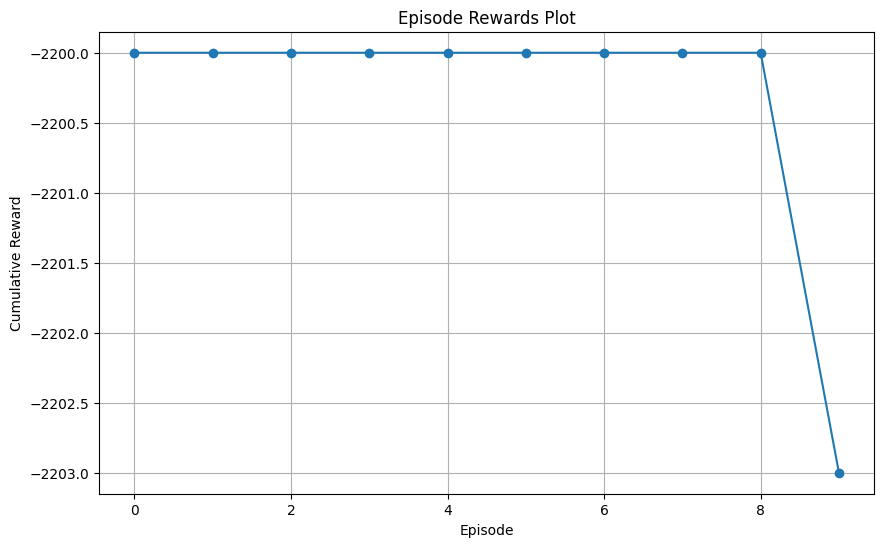

In [13]:
import matplotlib.pyplot as plt

# Load the training history from the output file
with open('fine-tune-2/fine_tuning_output.json', 'r') as f:
    training_data = json.load(f)

# Extract episode rewards from the training history
episode_rewards = [entry['average_reward'] for entry in training_data['training_history']]

# Create the Episode Rewards Plot
plt.figure(figsize=(10, 6))
plt.plot(episode_rewards, marker='o', linestyle='-')
plt.title('Episode Rewards Plot')
plt.xlabel('Episode')
plt.ylabel('Cumulative Reward')
plt.grid(True)
plt.savefig('fine-tune-episode-rewards.png')
plt.show()
